# sklearn实现超参数搜索

In [1]:
import matplotlib as mlt
import matplotlib.pyplot as plt
%matplotlib inline

import numpy as np
import pandas as pd

import sys
import os
import time

import tensorflow as tf
from tensorflow import keras

from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split

读取所用的数据

In [2]:
housing = fetch_california_housing()
x_train_all, x_test, y_train_all, y_test = train_test_split(housing.data,
                                                           housing.target,
                                                           test_size=0.25,
                                                           random_state=7)
x_train, x_val, y_train, y_val = train_test_split(x_train_all,
                                                  y_train_all,
                                                  test_size=0.25,
                                                  random_state=7)
print("train shape: ", x_train.shape)
print("validation shape: ", x_val.shape)
print("test shape: ", x_test.shape)

train shape:  (11610, 8)
validation shape:  (3870, 8)
test shape:  (5160, 8)


做归一化

In [3]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_val_scaled = scaler.transform(x_val)
x_test_scaled = scaler.transform(x_test)

将keras的模型转化成sklearn的模型

In [7]:

learning_rate = [1e-4, 3e-4, 1e-3, 3e-3, 1e-2, 3e-2]
def build_model(hidden_layers=1, layer_size=300, learning_rate=3e-3):
    model = keras.models.Sequential()
    model.add(keras.layers.Input(shape=x_train.shape[1:]))
    for _ in range(hidden_layers):
        model.add(keras.layers.Dense(300, activation='relu'))
    model.add(keras.layers.Dense(1))
    optimizer = keras.optimizers.SGD(lr=learning_rate)
    model.compile(optimizer=optimizer,loss='mse')
    return model

sklearn_model = keras.wrappers.scikit_learn.KerasRegressor(build_model)
history = sklearn_model.fit(x_train_scaled,
                y_train,
                epochs=10,
                validation_data=(
                    x_val_scaled,
                    y_val))

Train on 11610 samples, validate on 3870 samples
Epoch 1/10
11610/11610 [==============================] - 1s 64us/sample - loss: 1.1834 - val_loss: 0.6830
Epoch 2/10
11610/11610 [==============================] - 0s 35us/sample - loss: 0.6531 - val_loss: 0.5900
Epoch 3/10
11610/11610 [==============================] - 0s 36us/sample - loss: 0.5868 - val_loss: 0.5338
Epoch 4/10
11610/11610 [==============================] - 0s 35us/sample - loss: 0.5091 - val_loss: 0.4978
Epoch 5/10
11610/11610 [==============================] - 0s 35us/sample - loss: 0.4837 - val_loss: 0.4767
Epoch 6/10
11610/11610 [==============================] - 0s 35us/sample - loss: 0.4737 - val_loss: 0.4637
Epoch 7/10
11610/11610 [==============================] - 0s 36us/sample - loss: 0.4656 - val_loss: 0.4552
Epoch 8/10
11610/11610 [==============================] - 0s 40us/sample - loss: 0.4454 - val_loss: 0.4517
Epoch 9/10
11610/11610 [==============================] - 0s 42us/sample - loss: 0.4375 - val_l

画出各指标的变化趋势

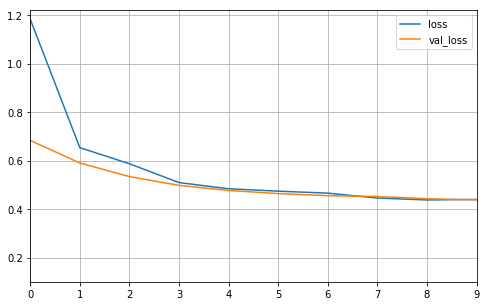

In [9]:
def curves(history):
    pd.DataFrame(history.history).plot(figsize=(8, 5))
    plt.grid(True)
    plt.gca().set_ylim(0.1)
    plt.show()
curves(history)

In [12]:
from scipy.stats import reciprocal
from sklearn.model_selection import RandomizedSearchCV
# f(x) = 1/(x*log(b/a)) a <= x <= b

param_distribution = {
    "hidden_layers": [1, 2, 3, 4],
    "layer_size": np.arange(1,100),
    "learning_rate": reciprocal(1e-4, 1e-2)
}

randomized_search = RandomizedSearchCV(sklearn_model,
                                       param_distribution,
                                       n_iter=10,
                                       n_jobs=1)
randomized_search.fit(x_train_scaled, y_train, epochs=100,
                     validation_data=(x_val_scaled, y_val))

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 1s 117us/sample - loss: 4.1764 - val_loss: 3.3154
Epoch 2/100
7740/7740 [==============================] - 1s 70us/sample - loss: 2.6131 - val_loss: 2.0726
Epoch 3/100
7740/7740 [==============================] - 1s 93us/sample - loss: 1.7294 - val_loss: 1.4350
Epoch 4/100
7740/7740 [==============================] - 1s 67us/sample - loss: 1.3210 - val_loss: 1.1611
Epoch 5/100
7740/7740 [==============================] - 0s 64us/sample - loss: 1.1333 - val_loss: 1.0306
Epoch 6/100
7740/7740 [==============================] - 1s 65us/sample - loss: 1.0270 - val_loss: 0.9530
Epoch 7/100
7740/7740 [==============================] - 1s 65us/sample - loss: 0.9532 - val_loss: 0.8978
Epoch 8/100
7740/7740 [==============================] - 0s 65us/sample - loss: 0.8971 - val_loss: 0.8553
Epoch 9/100
7740/7740 [==============================] - 1s 71us/sample - loss: 0.8533 - val_loss: 0.82

7740/7740 [==============================] - 0s 57us/sample - loss: 0.4602 - val_loss: 0.4654
Epoch 78/100
7740/7740 [==============================] - 0s 59us/sample - loss: 0.4586 - val_loss: 0.4640
Epoch 79/100
7740/7740 [==============================] - 0s 60us/sample - loss: 0.4570 - val_loss: 0.4623
Epoch 80/100
7740/7740 [==============================] - 1s 75us/sample - loss: 0.4554 - val_loss: 0.4610
Epoch 81/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.4539 - val_loss: 0.4595
Epoch 82/100
7740/7740 [==============================] - 0s 55us/sample - loss: 0.4524 - val_loss: 0.4580
Epoch 83/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.4509 - val_loss: 0.4567
Epoch 84/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.4495 - val_loss: 0.4552
Epoch 85/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.4480 - val_loss: 0.4537
Epoch 86/100
7740/7740 [==========================

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 1s 108us/sample - loss: 4.8021 - val_loss: 3.7537
Epoch 2/100
7740/7740 [==============================] - 0s 61us/sample - loss: 2.9811 - val_loss: 2.3202
Epoch 3/100
7740/7740 [==============================] - 0s 57us/sample - loss: 1.9589 - val_loss: 1.5488
Epoch 4/100
7740/7740 [==============================] - 0s 58us/sample - loss: 1.4626 - val_loss: 1.2069
Epoch 5/100
7740/7740 [==============================] - 0s 58us/sample - loss: 1.2121 - val_loss: 1.0365
Epoch 6/100
7740/7740 [==============================] - 0s 58us/sample - loss: 1.0650 - val_loss: 0.9444
Epoch 7/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.9658 - val_loss: 0.8793
Epoch 8/100
7740/7740 [==============================] - 0s 55us/sample - loss: 0.8939 - val_loss: 0.8342
Epoch 9/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.8402 - val_loss: 0.79

Epoch 77/100
7740/7740 [==============================] - 1s 65us/sample - loss: 0.4731 - val_loss: 0.4781
Epoch 78/100
7740/7740 [==============================] - 1s 67us/sample - loss: 0.4714 - val_loss: 0.4767
Epoch 79/100
7740/7740 [==============================] - 0s 55us/sample - loss: 0.4698 - val_loss: 0.4754
Epoch 80/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.4682 - val_loss: 0.4736
Epoch 81/100
7740/7740 [==============================] - 0s 55us/sample - loss: 0.4666 - val_loss: 0.4720
Epoch 82/100
7740/7740 [==============================] - 0s 57us/sample - loss: 0.4651 - val_loss: 0.4707
Epoch 83/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.4636 - val_loss: 0.4693
Epoch 84/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.4620 - val_loss: 0.4682
Epoch 85/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.4606 - val_loss: 0.4668
Epoch 86/100
7740/7740 [=============

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 1s 103us/sample - loss: 4.3803 - val_loss: 3.4241
Epoch 2/100
7740/7740 [==============================] - 0s 61us/sample - loss: 2.7559 - val_loss: 2.1692
Epoch 3/100
7740/7740 [==============================] - 0s 58us/sample - loss: 1.8922 - val_loss: 1.5123
Epoch 4/100
7740/7740 [==============================] - 0s 61us/sample - loss: 1.4447 - val_loss: 1.1998
Epoch 5/100
7740/7740 [==============================] - 0s 56us/sample - loss: 1.1976 - val_loss: 1.0402
Epoch 6/100
7740/7740 [==============================] - 0s 57us/sample - loss: 1.0427 - val_loss: 0.9451
Epoch 7/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.9413 - val_loss: 0.8806
Epoch 8/100
7740/7740 [==============================] - 0s 62us/sample - loss: 0.8713 - val_loss: 0.8329
Epoch 9/100
7740/7740 [==============================] - 1s 70us/sample - loss: 0.8220 - val_loss: 0.79

Epoch 77/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.4700 - val_loss: 0.4708
Epoch 78/100
7740/7740 [==============================] - 0s 57us/sample - loss: 0.4684 - val_loss: 0.4692
Epoch 79/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.4668 - val_loss: 0.4676
Epoch 80/100
7740/7740 [==============================] - 0s 57us/sample - loss: 0.4653 - val_loss: 0.4661
Epoch 81/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.4637 - val_loss: 0.4648
Epoch 82/100
7740/7740 [==============================] - 0s 57us/sample - loss: 0.4622 - val_loss: 0.4634
Epoch 83/100
7740/7740 [==============================] - 0s 60us/sample - loss: 0.4608 - val_loss: 0.4621
Epoch 84/100
7740/7740 [==============================] - 0s 63us/sample - loss: 0.4594 - val_loss: 0.4604
Epoch 85/100
7740/7740 [==============================] - 1s 76us/sample - loss: 0.4579 - val_loss: 0.4593
Epoch 86/100
7740/7740 [=============

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 1s 93us/sample - loss: 0.9407 - val_loss: 0.6071
Epoch 2/100
7740/7740 [==============================] - 0s 63us/sample - loss: 0.5505 - val_loss: 0.5076
Epoch 3/100
7740/7740 [==============================] - 0s 59us/sample - loss: 0.4781 - val_loss: 0.4610
Epoch 4/100
7740/7740 [==============================] - 1s 67us/sample - loss: 0.4393 - val_loss: 0.4227
Epoch 5/100
7740/7740 [==============================] - 1s 70us/sample - loss: 0.4099 - val_loss: 0.4072
Epoch 6/100
7740/7740 [==============================] - 0s 57us/sample - loss: 0.3932 - val_loss: 0.3934
Epoch 7/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.3782 - val_loss: 0.3863
Epoch 8/100
7740/7740 [==============================] - 0s 57us/sample - loss: 0.3679 - val_loss: 0.3749
Epoch 9/100
7740/7740 [==============================] - 0s 57us/sample - loss: 0.3603 - val_loss: 0.368

7740/7740 [==============================] - 0s 58us/sample - loss: 0.2507 - val_loss: 0.2936
Epoch 78/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.2436 - val_loss: 0.2902
Epoch 79/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.2413 - val_loss: 0.2948
Epoch 80/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.2411 - val_loss: 0.2879
Epoch 81/100
7740/7740 [==============================] - 1s 75us/sample - loss: 0.2388 - val_loss: 0.2910
Epoch 82/100
7740/7740 [==============================] - 0s 57us/sample - loss: 0.2389 - val_loss: 0.2918
Epoch 83/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.2379 - val_loss: 0.2968
Epoch 84/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.2393 - val_loss: 0.2995
Epoch 85/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.2375 - val_loss: 0.2980
Epoch 86/100
7740/7740 [==========================

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 1s 118us/sample - loss: 1.0213 - val_loss: 0.5655
Epoch 2/100
7740/7740 [==============================] - 1s 66us/sample - loss: 0.5113 - val_loss: 0.4696
Epoch 3/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.4438 - val_loss: 0.4291
Epoch 4/100
7740/7740 [==============================] - 0s 57us/sample - loss: 0.4138 - val_loss: 0.4076
Epoch 5/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.3946 - val_loss: 0.3922
Epoch 6/100
7740/7740 [==============================] - 0s 59us/sample - loss: 0.3841 - val_loss: 0.3846
Epoch 7/100
7740/7740 [==============================] - 0s 59us/sample - loss: 0.3729 - val_loss: 0.3810
Epoch 8/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.3658 - val_loss: 0.3692
Epoch 9/100
7740/7740 [==============================] - 0s 59us/sample - loss: 0.3590 - val_loss: 0.36

7740/7740 [==============================] - 1s 75us/sample - loss: 0.2556 - val_loss: 0.3128
Epoch 78/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.2550 - val_loss: 0.2921
Epoch 79/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.2563 - val_loss: 0.2977
Epoch 80/100
7740/7740 [==============================] - 0s 64us/sample - loss: 0.2542 - val_loss: 0.2864
Epoch 81/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.2558 - val_loss: 0.2975
Epoch 82/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.2553 - val_loss: 0.2921
Epoch 83/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.2509 - val_loss: 0.2964
Epoch 84/100
7740/7740 [==============================] - 0s 57us/sample - loss: 0.2519 - val_loss: 0.2918
Epoch 85/100
7740/7740 [==============================] - 0s 57us/sample - loss: 0.2542 - val_loss: 0.2875
Epoch 86/100
7740/7740 [==========================

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 1s 91us/sample - loss: 1.1946 - val_loss: 0.6096
Epoch 2/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.5621 - val_loss: 0.5242
Epoch 3/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.4977 - val_loss: 0.4711
Epoch 4/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.4544 - val_loss: 0.4406
Epoch 5/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.4269 - val_loss: 0.4170
Epoch 6/100
7740/7740 [==============================] - 0s 57us/sample - loss: 0.4075 - val_loss: 0.4082
Epoch 7/100
7740/7740 [==============================] - 0s 57us/sample - loss: 0.3984 - val_loss: 0.3957
Epoch 8/100
7740/7740 [==============================] - 1s 74us/sample - loss: 0.3825 - val_loss: 0.3840
Epoch 9/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.3737 - val_loss: 0.380

7740/7740 [==============================] - 0s 58us/sample - loss: 0.2549 - val_loss: 0.2917
Epoch 78/100
7740/7740 [==============================] - 0s 57us/sample - loss: 0.2543 - val_loss: 0.2889
Epoch 79/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.2532 - val_loss: 0.2930
Epoch 80/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.2524 - val_loss: 0.2917
Epoch 81/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.2528 - val_loss: 0.2973
Epoch 82/100
7740/7740 [==============================] - 0s 57us/sample - loss: 0.2509 - val_loss: 0.2902
Epoch 83/100
7740/7740 [==============================] - 0s 62us/sample - loss: 0.2512 - val_loss: 0.2985
Epoch 84/100
7740/7740 [==============================] - 1s 71us/sample - loss: 0.2513 - val_loss: 0.3178
Epoch 85/100
7740/7740 [==============================] - 1s 67us/sample - loss: 0.2495 - val_loss: 0.3073
Epoch 86/100
7740/7740 [==========================

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 1s 92us/sample - loss: 4.0531 - val_loss: 2.6220
Epoch 2/100
7740/7740 [==============================] - 0s 54us/sample - loss: 1.9227 - val_loss: 1.4286
Epoch 3/100
7740/7740 [==============================] - 0s 49us/sample - loss: 1.2329 - val_loss: 1.0380
Epoch 4/100
7740/7740 [==============================] - 0s 46us/sample - loss: 0.9810 - val_loss: 0.8860
Epoch 5/100
7740/7740 [==============================] - 0s 59us/sample - loss: 0.8592 - val_loss: 0.8060
Epoch 6/100
7740/7740 [==============================] - 0s 53us/sample - loss: 0.7896 - val_loss: 0.7578
Epoch 7/100
7740/7740 [==============================] - 0s 45us/sample - loss: 0.7468 - val_loss: 0.7264
Epoch 8/100
7740/7740 [==============================] - 0s 46us/sample - loss: 0.7178 - val_loss: 0.7040
Epoch 9/100
7740/7740 [==============================] - 0s 45us/sample - loss: 0.6967 - val_loss: 0.687

7740/7740 [==============================] - 0s 49us/sample - loss: 0.4260 - val_loss: 0.4329
Epoch 78/100
7740/7740 [==============================] - 0s 49us/sample - loss: 0.4250 - val_loss: 0.4316
Epoch 79/100
7740/7740 [==============================] - 0s 49us/sample - loss: 0.4239 - val_loss: 0.4306
Epoch 80/100
7740/7740 [==============================] - 0s 48us/sample - loss: 0.4229 - val_loss: 0.4300
Epoch 81/100
7740/7740 [==============================] - 0s 50us/sample - loss: 0.4219 - val_loss: 0.4288
Epoch 82/100
7740/7740 [==============================] - 0s 60us/sample - loss: 0.4211 - val_loss: 0.4281
Epoch 83/100
7740/7740 [==============================] - 0s 55us/sample - loss: 0.4200 - val_loss: 0.4276
Epoch 84/100
7740/7740 [==============================] - 0s 47us/sample - loss: 0.4192 - val_loss: 0.4265
Epoch 85/100
7740/7740 [==============================] - 0s 48us/sample - loss: 0.4182 - val_loss: 0.4257
Epoch 86/100
7740/7740 [==========================

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 1s 78us/sample - loss: 3.4464 - val_loss: 2.1903
Epoch 2/100
7740/7740 [==============================] - 0s 53us/sample - loss: 1.6699 - val_loss: 1.2440
Epoch 3/100
7740/7740 [==============================] - 0s 53us/sample - loss: 1.1097 - val_loss: 0.9404
Epoch 4/100
7740/7740 [==============================] - 0s 52us/sample - loss: 0.8926 - val_loss: 0.8209
Epoch 5/100
7740/7740 [==============================] - 0s 52us/sample - loss: 0.7938 - val_loss: 0.7596
Epoch 6/100
7740/7740 [==============================] - 0s 63us/sample - loss: 0.7428 - val_loss: 0.7243
Epoch 7/100
7740/7740 [==============================] - 0s 55us/sample - loss: 0.7126 - val_loss: 0.7008
Epoch 8/100
7740/7740 [==============================] - 0s 46us/sample - loss: 0.6920 - val_loss: 0.6839
Epoch 9/100
7740/7740 [==============================] - 0s 47us/sample - loss: 0.6762 - val_loss: 0.669

7740/7740 [==============================] - 0s 48us/sample - loss: 0.4217 - val_loss: 0.4326
Epoch 78/100
7740/7740 [==============================] - 0s 46us/sample - loss: 0.4208 - val_loss: 0.4315
Epoch 79/100
7740/7740 [==============================] - 0s 46us/sample - loss: 0.4200 - val_loss: 0.4308
Epoch 80/100
7740/7740 [==============================] - 0s 47us/sample - loss: 0.4191 - val_loss: 0.4299
Epoch 81/100
7740/7740 [==============================] - 0s 46us/sample - loss: 0.4183 - val_loss: 0.4292
Epoch 82/100
7740/7740 [==============================] - 0s 49us/sample - loss: 0.4175 - val_loss: 0.4286
Epoch 83/100
7740/7740 [==============================] - 0s 49us/sample - loss: 0.4167 - val_loss: 0.4276
Epoch 84/100
7740/7740 [==============================] - 0s 54us/sample - loss: 0.4159 - val_loss: 0.4270
Epoch 85/100
7740/7740 [==============================] - 0s 63us/sample - loss: 0.4152 - val_loss: 0.4263
Epoch 86/100
7740/7740 [==========================

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 1s 76us/sample - loss: 3.8389 - val_loss: 2.4299
Epoch 2/100
7740/7740 [==============================] - 0s 53us/sample - loss: 1.9155 - val_loss: 1.3813
Epoch 3/100
7740/7740 [==============================] - 0s 52us/sample - loss: 1.2235 - val_loss: 0.9979
Epoch 4/100
7740/7740 [==============================] - 0s 50us/sample - loss: 0.9300 - val_loss: 0.8345
Epoch 5/100
7740/7740 [==============================] - 0s 53us/sample - loss: 0.8007 - val_loss: 0.7639
Epoch 6/100
7740/7740 [==============================] - 0s 53us/sample - loss: 0.7381 - val_loss: 0.7257
Epoch 7/100
7740/7740 [==============================] - 0s 52us/sample - loss: 0.7046 - val_loss: 0.7015
Epoch 8/100
7740/7740 [==============================] - 0s 60us/sample - loss: 0.6837 - val_loss: 0.6848
Epoch 9/100
7740/7740 [==============================] - 0s 63us/sample - loss: 0.6690 - val_loss: 0.672

7740/7740 [==============================] - 0s 52us/sample - loss: 0.4309 - val_loss: 0.4367
Epoch 78/100
7740/7740 [==============================] - 0s 50us/sample - loss: 0.4299 - val_loss: 0.4359
Epoch 79/100
7740/7740 [==============================] - 0s 53us/sample - loss: 0.4290 - val_loss: 0.4348
Epoch 80/100
7740/7740 [==============================] - 0s 52us/sample - loss: 0.4281 - val_loss: 0.4339
Epoch 81/100
7740/7740 [==============================] - 0s 50us/sample - loss: 0.4271 - val_loss: 0.4330
Epoch 82/100
7740/7740 [==============================] - 0s 52us/sample - loss: 0.4263 - val_loss: 0.4321
Epoch 83/100
7740/7740 [==============================] - 0s 53us/sample - loss: 0.4254 - val_loss: 0.4313
Epoch 84/100
7740/7740 [==============================] - 0s 60us/sample - loss: 0.4245 - val_loss: 0.4307
Epoch 85/100
7740/7740 [==============================] - 0s 59us/sample - loss: 0.4237 - val_loss: 0.4298
Epoch 86/100
7740/7740 [==========================

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 1s 77us/sample - loss: 1.0670 - val_loss: 0.6404
Epoch 2/100
7740/7740 [==============================] - 0s 52us/sample - loss: 0.5898 - val_loss: 0.5528
Epoch 3/100
7740/7740 [==============================] - 0s 52us/sample - loss: 0.5206 - val_loss: 0.4984
Epoch 4/100
7740/7740 [==============================] - 0s 52us/sample - loss: 0.4763 - val_loss: 0.4713
Epoch 5/100
7740/7740 [==============================] - 0s 51us/sample - loss: 0.4502 - val_loss: 0.4484
Epoch 6/100
7740/7740 [==============================] - 0s 52us/sample - loss: 0.4322 - val_loss: 0.4349
Epoch 7/100
7740/7740 [==============================] - 0s 52us/sample - loss: 0.4182 - val_loss: 0.4228
Epoch 8/100
7740/7740 [==============================] - 1s 71us/sample - loss: 0.4088 - val_loss: 0.4238
Epoch 9/100
7740/7740 [==============================] - 0s 54us/sample - loss: 0.3992 - val_loss: 0.410

7740/7740 [==============================] - 0s 49us/sample - loss: 0.2702 - val_loss: 0.3062
Epoch 78/100
7740/7740 [==============================] - 0s 48us/sample - loss: 0.2691 - val_loss: 0.3084
Epoch 79/100
7740/7740 [==============================] - 0s 52us/sample - loss: 0.2700 - val_loss: 0.3090
Epoch 80/100
7740/7740 [==============================] - 0s 52us/sample - loss: 0.2684 - val_loss: 0.3159
Epoch 81/100
7740/7740 [==============================] - 0s 52us/sample - loss: 0.2738 - val_loss: 0.3063
Epoch 82/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.2677 - val_loss: 0.3139
Epoch 83/100
7740/7740 [==============================] - 0s 64us/sample - loss: 0.2664 - val_loss: 0.3028
Epoch 84/100
7740/7740 [==============================] - 0s 46us/sample - loss: 0.2660 - val_loss: 0.3117
Epoch 85/100
7740/7740 [==============================] - 0s 49us/sample - loss: 0.2699 - val_loss: 0.3075
Epoch 86/100
7740/7740 [==========================

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 1s 76us/sample - loss: 1.1072 - val_loss: 0.6390
Epoch 2/100
7740/7740 [==============================] - 0s 52us/sample - loss: 0.5890 - val_loss: 0.5319
Epoch 3/100
7740/7740 [==============================] - 0s 50us/sample - loss: 0.5056 - val_loss: 0.4852
Epoch 4/100
7740/7740 [==============================] - 0s 48us/sample - loss: 0.4684 - val_loss: 0.4573
Epoch 5/100
7740/7740 [==============================] - 0s 49us/sample - loss: 0.4466 - val_loss: 0.4381
Epoch 6/100
7740/7740 [==============================] - 0s 50us/sample - loss: 0.4331 - val_loss: 0.4296
Epoch 7/100
7740/7740 [==============================] - 0s 64us/sample - loss: 0.4126 - val_loss: 0.4138
Epoch 8/100
7740/7740 [==============================] - 0s 54us/sample - loss: 0.4032 - val_loss: 0.4083
Epoch 9/100
7740/7740 [==============================] - 0s 48us/sample - loss: 0.3947 - val_loss: 0.402

7740/7740 [==============================] - 0s 48us/sample - loss: 0.2902 - val_loss: 0.3100
Epoch 78/100
7740/7740 [==============================] - 0s 47us/sample - loss: 0.2875 - val_loss: 0.3107
Epoch 79/100
7740/7740 [==============================] - 0s 47us/sample - loss: 0.2869 - val_loss: 0.3099
Epoch 80/100
7740/7740 [==============================] - 0s 50us/sample - loss: 0.2851 - val_loss: 0.3133
Epoch 81/100
7740/7740 [==============================] - 0s 49us/sample - loss: 0.2874 - val_loss: 0.3075
Epoch 82/100
7740/7740 [==============================] - 0s 46us/sample - loss: 0.2848 - val_loss: 0.3103
Epoch 83/100
7740/7740 [==============================] - 0s 62us/sample - loss: 0.2852 - val_loss: 0.3068
Epoch 84/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.2886 - val_loss: 0.3080
Epoch 85/100
7740/7740 [==============================] - 0s 50us/sample - loss: 0.2821 - val_loss: 0.3085
Epoch 86/100
7740/7740 [==========================

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 1s 89us/sample - loss: 1.1281 - val_loss: 0.5838
Epoch 2/100
7740/7740 [==============================] - 0s 51us/sample - loss: 0.6048 - val_loss: 0.5277
Epoch 3/100
7740/7740 [==============================] - 0s 52us/sample - loss: 0.5069 - val_loss: 0.4851
Epoch 4/100
7740/7740 [==============================] - 0s 52us/sample - loss: 0.4695 - val_loss: 0.4514
Epoch 5/100
7740/7740 [==============================] - 0s 52us/sample - loss: 0.4415 - val_loss: 0.4359
Epoch 6/100
7740/7740 [==============================] - 0s 48us/sample - loss: 0.4256 - val_loss: 0.4210
Epoch 7/100
7740/7740 [==============================] - 1s 72us/sample - loss: 0.4137 - val_loss: 0.4114
Epoch 8/100
7740/7740 [==============================] - 0s 48us/sample - loss: 0.4069 - val_loss: 0.4217
Epoch 9/100
7740/7740 [==============================] - 0s 49us/sample - loss: 0.4017 - val_loss: 0.395

7740/7740 [==============================] - 0s 49us/sample - loss: 0.2868 - val_loss: 0.3099
Epoch 78/100
7740/7740 [==============================] - 0s 52us/sample - loss: 0.2877 - val_loss: 0.3083
Epoch 79/100
7740/7740 [==============================] - 0s 53us/sample - loss: 0.2878 - val_loss: 0.3077
Epoch 80/100
7740/7740 [==============================] - 0s 51us/sample - loss: 0.2875 - val_loss: 0.3071
Epoch 81/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.2852 - val_loss: 0.3090
Epoch 82/100
7740/7740 [==============================] - 0s 61us/sample - loss: 0.2855 - val_loss: 0.3236
Epoch 83/100
7740/7740 [==============================] - 0s 50us/sample - loss: 0.2848 - val_loss: 0.3104
Epoch 84/100
7740/7740 [==============================] - 0s 51us/sample - loss: 0.2839 - val_loss: 0.3073
Epoch 85/100
7740/7740 [==============================] - 0s 53us/sample - loss: 0.2806 - val_loss: 0.3031
Epoch 86/100
7740/7740 [==========================

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 1s 94us/sample - loss: 2.3813 - val_loss: 1.0786
Epoch 2/100
7740/7740 [==============================] - 0s 64us/sample - loss: 0.9445 - val_loss: 0.7971
Epoch 3/100
7740/7740 [==============================] - 0s 60us/sample - loss: 0.7566 - val_loss: 0.7156
Epoch 4/100
7740/7740 [==============================] - 1s 66us/sample - loss: 0.6915 - val_loss: 0.6790
Epoch 5/100
7740/7740 [==============================] - 1s 71us/sample - loss: 0.6572 - val_loss: 0.6488
Epoch 6/100
7740/7740 [==============================] - 0s 60us/sample - loss: 0.6306 - val_loss: 0.6248
Epoch 7/100
7740/7740 [==============================] - 0s 60us/sample - loss: 0.6080 - val_loss: 0.6050
Epoch 8/100
7740/7740 [==============================] - 0s 59us/sample - loss: 0.5884 - val_loss: 0.5847
Epoch 9/100
7740/7740 [==============================] - 0s 60us/sample - loss: 0.5705 - val_loss: 0.568

7740/7740 [==============================] - 1s 73us/sample - loss: 0.3354 - val_loss: 0.3553
Epoch 78/100
7740/7740 [==============================] - 1s 65us/sample - loss: 0.3342 - val_loss: 0.3527
Epoch 79/100
7740/7740 [==============================] - 0s 60us/sample - loss: 0.3336 - val_loss: 0.3545
Epoch 80/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.3327 - val_loss: 0.3516
Epoch 81/100
7740/7740 [==============================] - 0s 60us/sample - loss: 0.3321 - val_loss: 0.3513
Epoch 82/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.3314 - val_loss: 0.3508
Epoch 83/100
7740/7740 [==============================] - 0s 60us/sample - loss: 0.3304 - val_loss: 0.3501
Epoch 84/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.3298 - val_loss: 0.3491
Epoch 85/100
7740/7740 [==============================] - 0s 60us/sample - loss: 0.3290 - val_loss: 0.3489
Epoch 86/100
7740/7740 [==========================

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 1s 93us/sample - loss: 2.4712 - val_loss: 1.0759
Epoch 2/100
7740/7740 [==============================] - 0s 61us/sample - loss: 0.9106 - val_loss: 0.7800
Epoch 3/100
7740/7740 [==============================] - 0s 57us/sample - loss: 0.7396 - val_loss: 0.7035
Epoch 4/100
7740/7740 [==============================] - 0s 61us/sample - loss: 0.6787 - val_loss: 0.6608
Epoch 5/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.6431 - val_loss: 0.6303
Epoch 6/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.6148 - val_loss: 0.6050
Epoch 7/100
7740/7740 [==============================] - 1s 67us/sample - loss: 0.5904 - val_loss: 0.5825
Epoch 8/100
7740/7740 [==============================] - 1s 69us/sample - loss: 0.5688 - val_loss: 0.5627
Epoch 9/100
7740/7740 [==============================] - 0s 57us/sample - loss: 0.5494 - val_loss: 0.545

7740/7740 [==============================] - 0s 58us/sample - loss: 0.3434 - val_loss: 0.3593
Epoch 78/100
7740/7740 [==============================] - 0s 57us/sample - loss: 0.3429 - val_loss: 0.3585
Epoch 79/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.3421 - val_loss: 0.3586
Epoch 80/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.3411 - val_loss: 0.3567
Epoch 81/100
7740/7740 [==============================] - 0s 59us/sample - loss: 0.3408 - val_loss: 0.3570
Epoch 82/100
7740/7740 [==============================] - 1s 77us/sample - loss: 0.3399 - val_loss: 0.3557
Epoch 83/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.3389 - val_loss: 0.3565
Epoch 84/100
7740/7740 [==============================] - 0s 59us/sample - loss: 0.3388 - val_loss: 0.3546
Epoch 85/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.3383 - val_loss: 0.3539
Epoch 86/100
7740/7740 [==========================

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 1s 113us/sample - loss: 2.2953 - val_loss: 1.0467
Epoch 2/100
7740/7740 [==============================] - 1s 75us/sample - loss: 0.9136 - val_loss: 0.7420
Epoch 3/100
7740/7740 [==============================] - 0s 60us/sample - loss: 0.6949 - val_loss: 0.6698
Epoch 4/100
7740/7740 [==============================] - 0s 59us/sample - loss: 0.6449 - val_loss: 0.6361
Epoch 5/100
7740/7740 [==============================] - 0s 59us/sample - loss: 0.6165 - val_loss: 0.6106
Epoch 6/100
7740/7740 [==============================] - 0s 61us/sample - loss: 0.5935 - val_loss: 0.5888
Epoch 7/100
7740/7740 [==============================] - 0s 60us/sample - loss: 0.5737 - val_loss: 0.5699
Epoch 8/100
7740/7740 [==============================] - 0s 60us/sample - loss: 0.5563 - val_loss: 0.5528
Epoch 9/100
7740/7740 [==============================] - 0s 61us/sample - loss: 0.5405 - val_loss: 0.53

7740/7740 [==============================] - 0s 60us/sample - loss: 0.3423 - val_loss: 0.3599
Epoch 78/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.3418 - val_loss: 0.3578
Epoch 79/100
7740/7740 [==============================] - 0s 61us/sample - loss: 0.3412 - val_loss: 0.3572
Epoch 80/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.3405 - val_loss: 0.3573
Epoch 81/100
7740/7740 [==============================] - 0s 60us/sample - loss: 0.3394 - val_loss: 0.3566
Epoch 82/100
7740/7740 [==============================] - 0s 59us/sample - loss: 0.3390 - val_loss: 0.3566
Epoch 83/100
7740/7740 [==============================] - 0s 59us/sample - loss: 0.3388 - val_loss: 0.3546
Epoch 84/100
7740/7740 [==============================] - 0s 60us/sample - loss: 0.3380 - val_loss: 0.3546
Epoch 85/100
7740/7740 [==============================] - 1s 66us/sample - loss: 0.3373 - val_loss: 0.3543
Epoch 86/100
7740/7740 [==========================

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 1s 79us/sample - loss: 3.9970 - val_loss: 2.7026
Epoch 2/100
7740/7740 [==============================] - 0s 55us/sample - loss: 1.9912 - val_loss: 1.4918
Epoch 3/100
7740/7740 [==============================] - 0s 51us/sample - loss: 1.2764 - val_loss: 1.0689
Epoch 4/100
7740/7740 [==============================] - 0s 51us/sample - loss: 1.0034 - val_loss: 0.8913
Epoch 5/100
7740/7740 [==============================] - 0s 52us/sample - loss: 0.8634 - val_loss: 0.7967
Epoch 6/100
7740/7740 [==============================] - 1s 71us/sample - loss: 0.7818 - val_loss: 0.7411
Epoch 7/100
7740/7740 [==============================] - 0s 52us/sample - loss: 0.7315 - val_loss: 0.7064
Epoch 8/100
7740/7740 [==============================] - 0s 51us/sample - loss: 0.6994 - val_loss: 0.6838
Epoch 9/100
7740/7740 [==============================] - 0s 51us/sample - loss: 0.6777 - val_loss: 0.667

7740/7740 [==============================] - 0s 48us/sample - loss: 0.4343 - val_loss: 0.4432
Epoch 78/100
7740/7740 [==============================] - 0s 47us/sample - loss: 0.4332 - val_loss: 0.4420
Epoch 79/100
7740/7740 [==============================] - 0s 50us/sample - loss: 0.4321 - val_loss: 0.4411
Epoch 80/100
7740/7740 [==============================] - 0s 52us/sample - loss: 0.4311 - val_loss: 0.4403
Epoch 81/100
7740/7740 [==============================] - 0s 49us/sample - loss: 0.4300 - val_loss: 0.4391
Epoch 82/100
7740/7740 [==============================] - 0s 61us/sample - loss: 0.4289 - val_loss: 0.4382
Epoch 83/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.4279 - val_loss: 0.4375
Epoch 84/100
7740/7740 [==============================] - 0s 47us/sample - loss: 0.4268 - val_loss: 0.4364
Epoch 85/100
7740/7740 [==============================] - 0s 48us/sample - loss: 0.4258 - val_loss: 0.4355
Epoch 86/100
7740/7740 [==========================

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 1s 78us/sample - loss: 3.7410 - val_loss: 2.4811
Epoch 2/100
7740/7740 [==============================] - 0s 51us/sample - loss: 1.8771 - val_loss: 1.4255
Epoch 3/100
7740/7740 [==============================] - 0s 53us/sample - loss: 1.2450 - val_loss: 1.0488
Epoch 4/100
7740/7740 [==============================] - 0s 54us/sample - loss: 0.9801 - val_loss: 0.8804
Epoch 5/100
7740/7740 [==============================] - 0s 53us/sample - loss: 0.8488 - val_loss: 0.7954
Epoch 6/100
7740/7740 [==============================] - 1s 65us/sample - loss: 0.7770 - val_loss: 0.7454
Epoch 7/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.7345 - val_loss: 0.7132
Epoch 8/100
7740/7740 [==============================] - 0s 53us/sample - loss: 0.7068 - val_loss: 0.6913
Epoch 9/100
7740/7740 [==============================] - 0s 51us/sample - loss: 0.6872 - val_loss: 0.674

7740/7740 [==============================] - 0s 47us/sample - loss: 0.4269 - val_loss: 0.4374
Epoch 78/100
7740/7740 [==============================] - 0s 47us/sample - loss: 0.4258 - val_loss: 0.4367
Epoch 79/100
7740/7740 [==============================] - 0s 48us/sample - loss: 0.4249 - val_loss: 0.4358
Epoch 80/100
7740/7740 [==============================] - 0s 47us/sample - loss: 0.4240 - val_loss: 0.4350
Epoch 81/100
7740/7740 [==============================] - 0s 47us/sample - loss: 0.4231 - val_loss: 0.4341
Epoch 82/100
7740/7740 [==============================] - 0s 59us/sample - loss: 0.4222 - val_loss: 0.4333
Epoch 83/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.4212 - val_loss: 0.4324
Epoch 84/100
7740/7740 [==============================] - 0s 47us/sample - loss: 0.4204 - val_loss: 0.4316
Epoch 85/100
7740/7740 [==============================] - 0s 48us/sample - loss: 0.4195 - val_loss: 0.4309
Epoch 86/100
7740/7740 [==========================

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 1s 77us/sample - loss: 3.5768 - val_loss: 2.3709
Epoch 2/100
7740/7740 [==============================] - 0s 52us/sample - loss: 1.8586 - val_loss: 1.3448
Epoch 3/100
7740/7740 [==============================] - 0s 51us/sample - loss: 1.2161 - val_loss: 0.9879
Epoch 4/100
7740/7740 [==============================] - 0s 50us/sample - loss: 0.9452 - val_loss: 0.8403
Epoch 5/100
7740/7740 [==============================] - 0s 47us/sample - loss: 0.8183 - val_loss: 0.7696
Epoch 6/100
7740/7740 [==============================] - 0s 61us/sample - loss: 0.7538 - val_loss: 0.7309
Epoch 7/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.7171 - val_loss: 0.7065
Epoch 8/100
7740/7740 [==============================] - 0s 49us/sample - loss: 0.6936 - val_loss: 0.6889
Epoch 9/100
7740/7740 [==============================] - 0s 48us/sample - loss: 0.6768 - val_loss: 0.674

7740/7740 [==============================] - 0s 49us/sample - loss: 0.4335 - val_loss: 0.4381
Epoch 78/100
7740/7740 [==============================] - 0s 47us/sample - loss: 0.4325 - val_loss: 0.4372
Epoch 79/100
7740/7740 [==============================] - 0s 47us/sample - loss: 0.4314 - val_loss: 0.4363
Epoch 80/100
7740/7740 [==============================] - 0s 48us/sample - loss: 0.4304 - val_loss: 0.4352
Epoch 81/100
7740/7740 [==============================] - 0s 47us/sample - loss: 0.4295 - val_loss: 0.4344
Epoch 82/100
7740/7740 [==============================] - 0s 48us/sample - loss: 0.4286 - val_loss: 0.4335
Epoch 83/100
7740/7740 [==============================] - 0s 55us/sample - loss: 0.4277 - val_loss: 0.4327
Epoch 84/100
7740/7740 [==============================] - 0s 63us/sample - loss: 0.4267 - val_loss: 0.4318
Epoch 85/100
7740/7740 [==============================] - 0s 49us/sample - loss: 0.4258 - val_loss: 0.4310
Epoch 86/100
7740/7740 [==========================

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 0s 60us/sample - loss: 2.5304 - val_loss: 1.1577
Epoch 2/100
7740/7740 [==============================] - 0s 36us/sample - loss: 0.9063 - val_loss: 0.7736
Epoch 3/100
7740/7740 [==============================] - 0s 35us/sample - loss: 0.7368 - val_loss: 0.7141
Epoch 4/100
7740/7740 [==============================] - 0s 36us/sample - loss: 0.6949 - val_loss: 0.6874
Epoch 5/100
7740/7740 [==============================] - 0s 35us/sample - loss: 0.6706 - val_loss: 0.6674
Epoch 6/100
7740/7740 [==============================] - 0s 35us/sample - loss: 0.6510 - val_loss: 0.6502
Epoch 7/100
7740/7740 [==============================] - 0s 36us/sample - loss: 0.6336 - val_loss: 0.6338
Epoch 8/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.6178 - val_loss: 0.6194
Epoch 9/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.6037 - val_loss: 0.605

7740/7740 [==============================] - 0s 39us/sample - loss: 0.3999 - val_loss: 0.4108
Epoch 78/100
7740/7740 [==============================] - 0s 39us/sample - loss: 0.3990 - val_loss: 0.4105
Epoch 79/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3981 - val_loss: 0.4100
Epoch 80/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3975 - val_loss: 0.4091
Epoch 81/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3967 - val_loss: 0.4084
Epoch 82/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3959 - val_loss: 0.4077
Epoch 83/100
7740/7740 [==============================] - 0s 39us/sample - loss: 0.3950 - val_loss: 0.4075
Epoch 84/100
7740/7740 [==============================] - 0s 37us/sample - loss: 0.3944 - val_loss: 0.4067
Epoch 85/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3935 - val_loss: 0.4066
Epoch 86/100
7740/7740 [==========================

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 0s 60us/sample - loss: 2.6729 - val_loss: 1.2223
Epoch 2/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.9862 - val_loss: 0.8001
Epoch 3/100
7740/7740 [==============================] - 0s 37us/sample - loss: 0.7434 - val_loss: 0.7034
Epoch 4/100
7740/7740 [==============================] - 0s 37us/sample - loss: 0.6851 - val_loss: 0.6693
Epoch 5/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.6568 - val_loss: 0.6469
Epoch 6/100
7740/7740 [==============================] - 0s 37us/sample - loss: 0.6365 - val_loss: 0.6275
Epoch 7/100
7740/7740 [==============================] - 0s 48us/sample - loss: 0.6179 - val_loss: 0.6099
Epoch 8/100
7740/7740 [==============================] - 0s 46us/sample - loss: 0.6016 - val_loss: 0.5953
Epoch 9/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.5871 - val_loss: 0.581

7740/7740 [==============================] - 0s 37us/sample - loss: 0.4002 - val_loss: 0.4114
Epoch 78/100
7740/7740 [==============================] - 0s 37us/sample - loss: 0.3995 - val_loss: 0.4105
Epoch 79/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3989 - val_loss: 0.4095
Epoch 80/100
7740/7740 [==============================] - 0s 37us/sample - loss: 0.3981 - val_loss: 0.4089
Epoch 81/100
7740/7740 [==============================] - 0s 37us/sample - loss: 0.3974 - val_loss: 0.4088
Epoch 82/100
7740/7740 [==============================] - 0s 37us/sample - loss: 0.3966 - val_loss: 0.4079
Epoch 83/100
7740/7740 [==============================] - 0s 37us/sample - loss: 0.3960 - val_loss: 0.4074
Epoch 84/100
7740/7740 [==============================] - 0s 37us/sample - loss: 0.3953 - val_loss: 0.4062
Epoch 85/100
7740/7740 [==============================] - 0s 37us/sample - loss: 0.3948 - val_loss: 0.4056
Epoch 86/100
7740/7740 [==========================

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 1s 75us/sample - loss: 2.4079 - val_loss: 1.1279
Epoch 2/100
7740/7740 [==============================] - 0s 39us/sample - loss: 0.9025 - val_loss: 0.7701
Epoch 3/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.7335 - val_loss: 0.7025
Epoch 4/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.6853 - val_loss: 0.6693
Epoch 5/100
7740/7740 [==============================] - 0s 42us/sample - loss: 0.6567 - val_loss: 0.6457
Epoch 6/100
7740/7740 [==============================] - 0s 51us/sample - loss: 0.6341 - val_loss: 0.6252
Epoch 7/100
7740/7740 [==============================] - 0s 41us/sample - loss: 0.6150 - val_loss: 0.6079
Epoch 8/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.5985 - val_loss: 0.5931
Epoch 9/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.5836 - val_loss: 0.579

7740/7740 [==============================] - 0s 38us/sample - loss: 0.4006 - val_loss: 0.4099
Epoch 78/100
7740/7740 [==============================] - 0s 37us/sample - loss: 0.4001 - val_loss: 0.4088
Epoch 79/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3992 - val_loss: 0.4085
Epoch 80/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3986 - val_loss: 0.4079
Epoch 81/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3978 - val_loss: 0.4072
Epoch 82/100
7740/7740 [==============================] - 0s 37us/sample - loss: 0.3972 - val_loss: 0.4066
Epoch 83/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3966 - val_loss: 0.4062
Epoch 84/100
7740/7740 [==============================] - 0s 39us/sample - loss: 0.3961 - val_loss: 0.4054
Epoch 85/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3954 - val_loss: 0.4049
Epoch 86/100
7740/7740 [==========================

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 1s 77us/sample - loss: 3.5198 - val_loss: 2.1420
Epoch 2/100
7740/7740 [==============================] - 0s 58us/sample - loss: 1.6294 - val_loss: 1.2237
Epoch 3/100
7740/7740 [==============================] - 0s 63us/sample - loss: 1.1206 - val_loss: 0.9576
Epoch 4/100
7740/7740 [==============================] - 0s 48us/sample - loss: 0.9194 - val_loss: 0.8383
Epoch 5/100
7740/7740 [==============================] - 0s 48us/sample - loss: 0.8154 - val_loss: 0.7741
Epoch 6/100
7740/7740 [==============================] - 0s 48us/sample - loss: 0.7579 - val_loss: 0.7362
Epoch 7/100
7740/7740 [==============================] - 0s 52us/sample - loss: 0.7235 - val_loss: 0.7118
Epoch 8/100
7740/7740 [==============================] - 0s 52us/sample - loss: 0.7008 - val_loss: 0.6944
Epoch 9/100
7740/7740 [==============================] - 0s 50us/sample - loss: 0.6835 - val_loss: 0.679

7740/7740 [==============================] - 0s 47us/sample - loss: 0.4062 - val_loss: 0.4151
Epoch 78/100
7740/7740 [==============================] - 0s 49us/sample - loss: 0.4051 - val_loss: 0.4142
Epoch 79/100
7740/7740 [==============================] - 0s 57us/sample - loss: 0.4041 - val_loss: 0.4132
Epoch 80/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.4032 - val_loss: 0.4126
Epoch 81/100
7740/7740 [==============================] - 0s 48us/sample - loss: 0.4023 - val_loss: 0.4116
Epoch 82/100
7740/7740 [==============================] - 0s 47us/sample - loss: 0.4015 - val_loss: 0.4109
Epoch 83/100
7740/7740 [==============================] - 0s 47us/sample - loss: 0.4006 - val_loss: 0.4106
Epoch 84/100
7740/7740 [==============================] - 0s 48us/sample - loss: 0.3998 - val_loss: 0.4093
Epoch 85/100
7740/7740 [==============================] - 0s 47us/sample - loss: 0.3989 - val_loss: 0.4085
Epoch 86/100
7740/7740 [==========================

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 1s 78us/sample - loss: 3.4027 - val_loss: 1.9153
Epoch 2/100
7740/7740 [==============================] - 0s 51us/sample - loss: 1.3854 - val_loss: 1.0324
Epoch 3/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.9374 - val_loss: 0.8310
Epoch 4/100
7740/7740 [==============================] - 0s 64us/sample - loss: 0.7911 - val_loss: 0.7499
Epoch 5/100
7740/7740 [==============================] - 0s 50us/sample - loss: 0.7258 - val_loss: 0.7067
Epoch 6/100
7740/7740 [==============================] - 0s 49us/sample - loss: 0.6910 - val_loss: 0.6809
Epoch 7/100
7740/7740 [==============================] - 0s 47us/sample - loss: 0.6684 - val_loss: 0.6619
Epoch 8/100
7740/7740 [==============================] - 0s 47us/sample - loss: 0.6511 - val_loss: 0.6465
Epoch 9/100
7740/7740 [==============================] - 0s 48us/sample - loss: 0.6364 - val_loss: 0.633

7740/7740 [==============================] - 0s 49us/sample - loss: 0.4054 - val_loss: 0.4178
Epoch 78/100
7740/7740 [==============================] - 0s 49us/sample - loss: 0.4046 - val_loss: 0.4172
Epoch 79/100
7740/7740 [==============================] - 0s 50us/sample - loss: 0.4038 - val_loss: 0.4164
Epoch 80/100
7740/7740 [==============================] - 0s 63us/sample - loss: 0.4028 - val_loss: 0.4153
Epoch 81/100
7740/7740 [==============================] - 0s 56us/sample - loss: 0.4023 - val_loss: 0.4146
Epoch 82/100
7740/7740 [==============================] - 0s 48us/sample - loss: 0.4014 - val_loss: 0.4144
Epoch 83/100
7740/7740 [==============================] - 0s 50us/sample - loss: 0.4007 - val_loss: 0.4133
Epoch 84/100
7740/7740 [==============================] - 0s 50us/sample - loss: 0.4000 - val_loss: 0.4129
Epoch 85/100
7740/7740 [==============================] - 0s 51us/sample - loss: 0.3993 - val_loss: 0.4121
Epoch 86/100
7740/7740 [==========================

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 1s 77us/sample - loss: 3.1722 - val_loss: 1.8793
Epoch 2/100
7740/7740 [==============================] - 0s 49us/sample - loss: 1.4701 - val_loss: 1.0677
Epoch 3/100
7740/7740 [==============================] - 0s 50us/sample - loss: 0.9781 - val_loss: 0.8339
Epoch 4/100
7740/7740 [==============================] - 1s 67us/sample - loss: 0.8110 - val_loss: 0.7538
Epoch 5/100
7740/7740 [==============================] - 0s 52us/sample - loss: 0.7436 - val_loss: 0.7164
Epoch 6/100
7740/7740 [==============================] - 0s 50us/sample - loss: 0.7097 - val_loss: 0.6935
Epoch 7/100
7740/7740 [==============================] - 0s 48us/sample - loss: 0.6882 - val_loss: 0.6765
Epoch 8/100
7740/7740 [==============================] - 0s 48us/sample - loss: 0.6717 - val_loss: 0.6626
Epoch 9/100
7740/7740 [==============================] - 0s 47us/sample - loss: 0.6577 - val_loss: 0.650

7740/7740 [==============================] - 0s 48us/sample - loss: 0.4161 - val_loss: 0.4211
Epoch 78/100
7740/7740 [==============================] - 0s 48us/sample - loss: 0.4152 - val_loss: 0.4202
Epoch 79/100
7740/7740 [==============================] - 0s 48us/sample - loss: 0.4144 - val_loss: 0.4191
Epoch 80/100
7740/7740 [==============================] - 0s 52us/sample - loss: 0.4135 - val_loss: 0.4186
Epoch 81/100
7740/7740 [==============================] - 0s 64us/sample - loss: 0.4127 - val_loss: 0.4177
Epoch 82/100
7740/7740 [==============================] - 0s 54us/sample - loss: 0.4118 - val_loss: 0.4172
Epoch 83/100
7740/7740 [==============================] - 0s 50us/sample - loss: 0.4110 - val_loss: 0.4161
Epoch 84/100
7740/7740 [==============================] - 0s 50us/sample - loss: 0.4101 - val_loss: 0.4159
Epoch 85/100
7740/7740 [==============================] - 0s 49us/sample - loss: 0.4093 - val_loss: 0.4154
Epoch 86/100
7740/7740 [==========================

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 0s 59us/sample - loss: 1.7984 - val_loss: 0.8217
Epoch 2/100
7740/7740 [==============================] - 0s 37us/sample - loss: 0.7553 - val_loss: 0.7076
Epoch 3/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.6835 - val_loss: 0.6663
Epoch 4/100
7740/7740 [==============================] - 0s 39us/sample - loss: 0.6450 - val_loss: 0.6336
Epoch 5/100
7740/7740 [==============================] - 0s 45us/sample - loss: 0.6145 - val_loss: 0.6061
Epoch 6/100
7740/7740 [==============================] - 0s 50us/sample - loss: 0.5878 - val_loss: 0.5839
Epoch 7/100
7740/7740 [==============================] - 0s 39us/sample - loss: 0.5662 - val_loss: 0.5614
Epoch 8/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.5463 - val_loss: 0.5438
Epoch 9/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.5310 - val_loss: 0.530

7740/7740 [==============================] - 0s 38us/sample - loss: 0.3690 - val_loss: 0.3856
Epoch 78/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3683 - val_loss: 0.3846
Epoch 79/100
7740/7740 [==============================] - 0s 39us/sample - loss: 0.3677 - val_loss: 0.3859
Epoch 80/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3673 - val_loss: 0.3841
Epoch 81/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3662 - val_loss: 0.3848
Epoch 82/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3659 - val_loss: 0.3835
Epoch 83/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3651 - val_loss: 0.3840
Epoch 84/100
7740/7740 [==============================] - 0s 39us/sample - loss: 0.3647 - val_loss: 0.3823
Epoch 85/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3640 - val_loss: 0.3816
Epoch 86/100
7740/7740 [==========================

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 0s 59us/sample - loss: 1.9131 - val_loss: 0.8616
Epoch 2/100
7740/7740 [==============================] - 0s 50us/sample - loss: 0.7610 - val_loss: 0.6980
Epoch 3/100
7740/7740 [==============================] - 0s 45us/sample - loss: 0.6817 - val_loss: 0.6511
Epoch 4/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.6412 - val_loss: 0.6195
Epoch 5/100
7740/7740 [==============================] - 0s 39us/sample - loss: 0.6087 - val_loss: 0.5923
Epoch 6/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.5825 - val_loss: 0.5697
Epoch 7/100
7740/7740 [==============================] - 0s 37us/sample - loss: 0.5606 - val_loss: 0.5512
Epoch 8/100
7740/7740 [==============================] - 0s 41us/sample - loss: 0.5424 - val_loss: 0.5341
Epoch 9/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.5259 - val_loss: 0.519

7740/7740 [==============================] - 0s 41us/sample - loss: 0.3752 - val_loss: 0.3864
Epoch 78/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3746 - val_loss: 0.3851
Epoch 79/100
7740/7740 [==============================] - 0s 37us/sample - loss: 0.3731 - val_loss: 0.3861
Epoch 80/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3733 - val_loss: 0.3854
Epoch 81/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3726 - val_loss: 0.3837
Epoch 82/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3715 - val_loss: 0.3836
Epoch 83/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3707 - val_loss: 0.3840
Epoch 84/100
7740/7740 [==============================] - 0s 44us/sample - loss: 0.3702 - val_loss: 0.3842
Epoch 85/100
7740/7740 [==============================] - 0s 51us/sample - loss: 0.3701 - val_loss: 0.3818
Epoch 86/100
7740/7740 [==========================

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 1s 65us/sample - loss: 1.8916 - val_loss: 0.8392
Epoch 2/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.7516 - val_loss: 0.7130
Epoch 3/100
7740/7740 [==============================] - 0s 39us/sample - loss: 0.6885 - val_loss: 0.6746
Epoch 4/100
7740/7740 [==============================] - 0s 37us/sample - loss: 0.6531 - val_loss: 0.6437
Epoch 5/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.6249 - val_loss: 0.6180
Epoch 6/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.6014 - val_loss: 0.5942
Epoch 7/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.5805 - val_loss: 0.5760
Epoch 8/100
7740/7740 [==============================] - 0s 37us/sample - loss: 0.5625 - val_loss: 0.5594
Epoch 9/100
7740/7740 [==============================] - 0s 37us/sample - loss: 0.5471 - val_loss: 0.545

7740/7740 [==============================] - 0s 38us/sample - loss: 0.3794 - val_loss: 0.3899
Epoch 78/100
7740/7740 [==============================] - 0s 37us/sample - loss: 0.3787 - val_loss: 0.3892
Epoch 79/100
7740/7740 [==============================] - 0s 37us/sample - loss: 0.3779 - val_loss: 0.3887
Epoch 80/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3772 - val_loss: 0.3886
Epoch 81/100
7740/7740 [==============================] - 0s 37us/sample - loss: 0.3766 - val_loss: 0.3874
Epoch 82/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3759 - val_loss: 0.3873
Epoch 83/100
7740/7740 [==============================] - 0s 51us/sample - loss: 0.3758 - val_loss: 0.3862
Epoch 84/100
7740/7740 [==============================] - 0s 42us/sample - loss: 0.3747 - val_loss: 0.3858
Epoch 85/100
7740/7740 [==============================] - 0s 37us/sample - loss: 0.3746 - val_loss: 0.3853
Epoch 86/100
7740/7740 [==========================

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 0s 59us/sample - loss: 0.8732 - val_loss: 0.5895
Epoch 2/100
7740/7740 [==============================] - 0s 37us/sample - loss: 0.5525 - val_loss: 0.5230
Epoch 3/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.4843 - val_loss: 0.4698
Epoch 4/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.4589 - val_loss: 0.4483
Epoch 5/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.4373 - val_loss: 0.4376
Epoch 6/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.4276 - val_loss: 0.4268
Epoch 7/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.4148 - val_loss: 0.4196
Epoch 8/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.4063 - val_loss: 0.4096
Epoch 9/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3994 - val_loss: 0.410

7740/7740 [==============================] - 0s 38us/sample - loss: 0.2986 - val_loss: 0.3240
Epoch 78/100
7740/7740 [==============================] - 0s 40us/sample - loss: 0.2980 - val_loss: 0.3225
Epoch 79/100
7740/7740 [==============================] - 0s 37us/sample - loss: 0.2978 - val_loss: 0.3266
Epoch 80/100
7740/7740 [==============================] - 0s 42us/sample - loss: 0.2983 - val_loss: 0.3213
Epoch 81/100
7740/7740 [==============================] - 0s 47us/sample - loss: 0.2958 - val_loss: 0.3279
Epoch 82/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.2983 - val_loss: 0.3259
Epoch 83/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3018 - val_loss: 0.4042
Epoch 84/100
7740/7740 [==============================] - 0s 37us/sample - loss: 0.3031 - val_loss: 0.3200
Epoch 85/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3017 - val_loss: 0.3243
Epoch 86/100
7740/7740 [==========================

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 0s 59us/sample - loss: 1.0567 - val_loss: 1.3213
Epoch 2/100
7740/7740 [==============================] - 0s 39us/sample - loss: 2.7829 - val_loss: 0.4802
Epoch 3/100
7740/7740 [==============================] - 0s 40us/sample - loss: 0.4403 - val_loss: 0.4153
Epoch 4/100
7740/7740 [==============================] - 0s 36us/sample - loss: 0.3978 - val_loss: 0.3907
Epoch 5/100
7740/7740 [==============================] - 0s 39us/sample - loss: 0.3961 - val_loss: 0.3786
Epoch 6/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3906 - val_loss: 0.3808
Epoch 7/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3720 - val_loss: 0.3720
Epoch 8/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3632 - val_loss: 0.3674
Epoch 9/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3752 - val_loss: 0.368

7740/7740 [==============================] - 0s 51us/sample - loss: 0.3006 - val_loss: 0.3213
Epoch 78/100
7740/7740 [==============================] - 0s 42us/sample - loss: 0.3044 - val_loss: 0.3205
Epoch 79/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3069 - val_loss: 0.3205
Epoch 80/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3006 - val_loss: 0.3339
Epoch 81/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3064 - val_loss: 0.3178
Epoch 82/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3022 - val_loss: 0.3186
Epoch 83/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3004 - val_loss: 0.3193
Epoch 84/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3014 - val_loss: 0.3182
Epoch 85/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.2972 - val_loss: 0.3186
Epoch 86/100
7740/7740 [==========================

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/100
7740/7740 [==============================] - 0s 58us/sample - loss: 0.8882 - val_loss: 0.6037
Epoch 2/100
7740/7740 [==============================] - 0s 39us/sample - loss: 0.6931 - val_loss: 0.4779
Epoch 3/100
7740/7740 [==============================] - 0s 38us/sample - loss: 2.5390 - val_loss: 0.5829
Epoch 4/100
7740/7740 [==============================] - 0s 37us/sample - loss: 0.5127 - val_loss: 0.4835
Epoch 5/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.4748 - val_loss: 0.4541
Epoch 6/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.4117 - val_loss: 0.4032
Epoch 7/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3938 - val_loss: 0.3926
Epoch 8/100
7740/7740 [==============================] - 0s 49us/sample - loss: 0.4087 - val_loss: 0.4936
Epoch 9/100
7740/7740 [==============================] - 0s 47us/sample - loss: 0.3929 - val_loss: 0.394

Epoch 77/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3125 - val_loss: 0.3238
Epoch 78/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3094 - val_loss: 0.3358
Epoch 79/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3139 - val_loss: 0.3246
Epoch 80/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3178 - val_loss: 0.3271
Epoch 81/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3095 - val_loss: 0.3266
Epoch 82/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3090 - val_loss: 0.3257
Epoch 83/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3074 - val_loss: 0.3273
Epoch 84/100
7740/7740 [==============================] - 0s 38us/sample - loss: 0.3058 - val_loss: 0.3457
Epoch 85/100
7740/7740 [==============================] - 0s 39us/sample - loss: 0.3067 - val_loss: 0.3205
Epoch 86/100
7740/7740 [=============

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 11610 samples, validate on 3870 samples
Epoch 1/100
11610/11610 [==============================] - 1s 77us/sample - loss: 0.8968 - val_loss: 0.5137
Epoch 2/100
11610/11610 [==============================] - 1s 64us/sample - loss: 0.4685 - val_loss: 0.4338
Epoch 3/100
11610/11610 [==============================] - 1s 63us/sample - loss: 0.4135 - val_loss: 0.4011
Epoch 4/100
11610/11610 [==============================] - 1s 54us/sample - loss: 0.3875 - val_loss: 0.3877
Epoch 5/100
11610/11610 [==============================] - 1s 55us/sample - loss: 0.3762 - val_loss: 0.3779
Epoch 6/100
11610/11610 [==============================] - 1s 55us/sample - loss: 0.3600 - val_loss: 0.3623
Epoch 7/100
11610/11610 [==============================] - 1s 55us/sample - loss: 0.3541 - val_loss: 0.3573
Epoch 8/100
11610/11610 [==============================] - 1s 55us/sample - loss: 0.3535 - val_loss: 0.3531
Epoch 9/100
11610/11610 [==============================] - 1s 55us/sample - loss: 0.339

Epoch 76/100
11610/11610 [==============================] - 1s 64us/sample - loss: 0.2466 - val_loss: 0.2825
Epoch 77/100
11610/11610 [==============================] - 1s 70us/sample - loss: 0.2472 - val_loss: 0.2817
Epoch 78/100
11610/11610 [==============================] - 1s 57us/sample - loss: 0.2448 - val_loss: 0.2806
Epoch 79/100
11610/11610 [==============================] - 1s 55us/sample - loss: 0.2421 - val_loss: 0.2770
Epoch 80/100
11610/11610 [==============================] - 1s 57us/sample - loss: 0.2434 - val_loss: 0.2746
Epoch 81/100
11610/11610 [==============================] - 1s 56us/sample - loss: 0.2437 - val_loss: 0.2709
Epoch 82/100
11610/11610 [==============================] - 1s 55us/sample - loss: 0.2412 - val_loss: 0.2830
Epoch 83/100
11610/11610 [==============================] - 1s 56us/sample - loss: 0.2412 - val_loss: 0.2788
Epoch 84/100
11610/11610 [==============================] - 1s 66us/sample - loss: 0.2408 - val_loss: 0.2777
Epoch 85/100
11610/

RandomizedSearchCV(cv='warn', error_score='raise-deprecating',
          estimator=<tensorflow.python.keras.wrappers.scikit_learn.KerasRegressor object at 0x000001ED59BC9400>,
          fit_params=None, iid='warn', n_iter=10, n_jobs=1,
          param_distributions={'hidden_layers': [1, 2, 3, 4], 'layer_size': array([ 1,  2, ..., 98, 99]), 'learning_rate': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001ED5BB022B0>},
          pre_dispatch='2*n_jobs', random_state=None, refit=True,
          return_train_score='warn', scoring=None, verbose=0)

In [15]:
print("Best param: ",randomized_search.best_params_)
print("Best score: ",randomized_search.best_score_)
print("Best model: ",randomized_search.best_estimator_)

Best param:  {'hidden_layers': 3, 'layer_size': 92, 'learning_rate': 0.005145653219492522}
Best score:  -0.31545941028278723
Best model:  <tensorflow.python.keras.wrappers.scikit_learn.KerasRegressor object at 0x000001ED5BB02080>
